#Social Distance Detection from real-time video feeds

This colab demonstrates the python implementation to detect pedestrians from real-time video feeds using OpenCV and TensorFlow Detection model.

## Approach

3 main steps:
1. Pedestrian Detection
2. Calibration
3. Distance violation determination

##Model Description

Based on our project requirement, the object detection model has to be trained to detect the presence and location of "people" in the video feed. As the detector would be running on real-time video feeds using TensorFlow Lite with Python on a Raspberry Pi 4 Model B, the model needs to have high speed with low latency without compensating for its accuracy.

## Model Benchmarks

Input Video : [pedestrians.mp4](https://github.com/piyush-cosmo/WoC_sdd_test/releases/download/v0.0.3/pedestrians.mp4) - 21 min

<table>
<tr>
<th>Model Name</th>
<th>Model Size(MB)</th>
<th>Elapsed Time(s)</th>
<th>FPS</th>
</tr>
<tr>
<td>SSD_mobileDet_cpu_coco_int8</td>
<td>4.9</td>
<td>705.32</td>
<td>0.75</td>
</tr>
<tr>
<td>SSD_mobileDet_cpu_coco_fp16</td>
<td>8.2</td>
<td>53.38</td>
<td>9.98</td>
</tr>
<tr>
<td>SSD_mobileDet_cpu_coco_dr</td>
<td>4.9</td>
<td>708.57</td>
<td>0.75</td>
</tr>
</table>

Best Result : `SSD_mobileDet_cpu_coco_fp16`


### Process Involved:

The pretrained model used here is [MobileDet](https://arxiv.org/abs/2004.14525) (checkpoints collected from the [TensorFlow Object Detection API repository](https://github.com/tensorflow/models/tree/master/research/object_detection)).

1. Converted the model checkpoint into compatible TensorFlow Lite (TFLite) model graph.
2. Created my own representative dataset by subsampling 200 images from COCO dataset.
3. Quantized the TFLite model graph into TFLite model by using representative dataset.
4. Run inference on videos.

## Converting model SSD_MobileDet_cpu_coco to TFLite model graph

As MobileDet model was trained in TensorFlow 1 we will need this for the conversion process.

### Setup

In [ ]:
%tensorflow_version 1.x
import tensorflow as tf

!git clone --quiet https://github.com/tensorflow/models.git

TensorFlow 1.x selected.


### Installing TFOD Api

In [ ]:
%%bash
pip install --upgrade pip

cd models/research

# Compile protos
protoc object_detection/protos/*.proto --python_out=.

# Install TensorFlow Object Detection API.
cp object_detection/packages/tf1/setup.py .
python -m pip install --use-feature=2020-resolver .

  Found existing installation: pip 19.3.1
    Uninstalling pip-19.3.1:
      Successfully uninstalled pip-19.3.1
Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1606851 sha256=5dd1c8e62163a797fdd5ac7461ed03160b26603cd1ed2444621a170e1c6f81e5
  Stored in directory: /tmp/pip-ephem-wheel-cache-3uoy_yjh/wheels/16/63/fd/1293066bf448f757979af1b45c59b0e33b46f12d4454d12fde
Successfully built object-detection


### Fetching model SSD_MobileDet_cpu_coco checkpoint

The checkpoint of pretrained model on COCO dataset

In [ ]:
mobiledet_checkpoint_name = "ssd_mobiledet_cpu_coco" 

checkpoint_dict = {
    "ssd_mobiledet_cpu_coco": "http://download.tensorflow.org/models/object_detection/ssdlite_mobiledet_cpu_320x320_coco_2020_05_19.tar.gz"
}

folder_name_dict = {
    "ssd_mobiledet_cpu_coco": "ssdlite_mobiledet_cpu_320x320_coco_2020_05_19"
}

checkpoint_selected = checkpoint_dict[mobiledet_checkpoint_name]
folder_name = folder_name_dict[mobiledet_checkpoint_name]

# Get the pre-trained MobileDet checkpoints
!rm -rf folder_name
!wget -q $checkpoint_selected -O checkpoints.tar.gz
!tar -xvf checkpoints.tar.gz

ssdlite_mobiledet_cpu_320x320_coco_2020_05_19/
ssdlite_mobiledet_cpu_320x320_coco_2020_05_19/model.ckpt-400000.data-00000-of-00001
ssdlite_mobiledet_cpu_320x320_coco_2020_05_19/model.ckpt-400000.index
ssdlite_mobiledet_cpu_320x320_coco_2020_05_19/model.ckpt-400000.meta
ssdlite_mobiledet_cpu_320x320_coco_2020_05_19/tflite_graph.pbtxt
ssdlite_mobiledet_cpu_320x320_coco_2020_05_19/tflite_graph.pb
ssdlite_mobiledet_cpu_320x320_coco_2020_05_19/pipeline.config
ssdlite_mobiledet_cpu_320x320_coco_2020_05_19/model.tflite


### Converting model checkpoints to TFLite compatible model graph

In [ ]:
!python /content/models/research/object_detection/export_tflite_ssd_graph.py \
        --pipeline_config_path=$folder_name/pipeline.config \
        --trained_checkpoint_prefix=$folder_name/model.ckpt-400000 \
        --output_directory=$folder_name \
        --add_postprocessing_op=true
print("======Graph generated========")
!ls -lh $folder_name/*.pb

Instructions for updating:
Please use `layer.__call__` method instead.
W1231 15:59:54.216430 140057327265664 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tf_slim/layers/layers.py:1089: Layer.apply (from tensorflow.python.keras.engine.base_layer) is deprecated and will be removed in a future version.
Instructions for updating:
Please use `layer.__call__` method instead.
INFO:tensorflow:depth of additional conv before box predictor: 0
I1231 15:59:57.534079 140057327265664 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv before box predictor: 0
I1231 15:59:57.616891 140057327265664 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv before box predictor: 0
I1231 15:59:57.705896 140057327265664 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv befo

## Converting TFLite model graph to TFLite model

**Note** - We first need to restart our Colab Runtime because we are switching to TensorFlow 2 for the conversion process.

### Setup

In [ ]:
%tensorflow_version 2.x
import tensorflow as tf

import os

TensorFlow is already loaded. Please restart the runtime to change versions.


### Download the COCO dataset

In [ ]:
!mkdir train_samples

In [ ]:
#@title Download the COCO `train2014` training annotations and subsample 200 images for person only
#@markdown **Note** - Run this if you want to create your own dataset.
from pycocotools.coco import COCO
import requests
import random

# instantiate COCO specifying the annotations json path
coco = COCO('/content/gdrive/MyDrive/annotations_trainval2014/annotations/instances_train2014.json')
# Specify a list of category names of interest
catIds = coco.getCatIds(catNms=['person'])
# Get the corresponding image ids and images using loadImgs
imgIds = coco.getImgIds(catIds=catIds)
images = coco.loadImgs(imgIds)

random.shuffle(images)

two_hundred_images = images[:200]



for im in two_hundred_images:
    img_data = requests.get(im['coco_url']).content
    with open('/content/train_samples/' + im['file_name'], 'wb') as handler:
        handler.write(img_data)

In [ ]:
!wget -q https://github.com/piyush-cosmo/WoC_sdd_test/releases/download/v0.0.2/train_samples.zip
!unzip "/content/train_samples.zip" -d "/content/train_samples/"

Archive:  /content/train_samples.zip
   creating: /content/train_samples/content/train_samples/
  inflating: /content/train_samples/content/train_samples/COCO_train2014_000000127932.jpg  
  inflating: /content/train_samples/content/train_samples/COCO_train2014_000000260888.jpg  
  inflating: /content/train_samples/content/train_samples/COCO_train2014_000000404739.jpg  
  inflating: /content/train_samples/content/train_samples/COCO_train2014_000000578119.jpg  
  inflating: /content/train_samples/content/train_samples/COCO_train2014_000000167862.jpg  
  inflating: /content/train_samples/content/train_samples/COCO_train2014_000000219141.jpg  
  inflating: /content/train_samples/content/train_samples/COCO_train2014_000000056677.jpg  
  inflating: /content/train_samples/content/train_samples/COCO_train2014_000000204775.jpg  
  inflating: /content/train_samples/content/train_samples/COCO_train2014_000000558851.jpg  
  inflating: /content/train_samples/content/train_samples/COCO_train2014_000

### Model to be quantized

In [ ]:
#@title Select model to quantize
model_checkpoint_name = "ssd_mobiledet_cpu_coco" #@param ["ssd_mobiledet_cpu_coco"]
model_dict = {
    "ssd_mobiledet_cpu_coco": "ssdlite_mobiledet_cpu_320x320_coco_2020_05_19/tflite_graph.pb"
}
model_to_be_quantized = model_dict[model_checkpoint_name]
if os.path.getsize(model_to_be_quantized) > 0:
    print(f"We are quantizing: {model_dict[model_checkpoint_name]}")
else:
    print("Model not found!")

We are quantizing: ssdlite_mobiledet_cpu_320x320_coco_2020_05_19/tflite_graph.pb


### Configuration

In [ ]:
# Set default values for parameters
HEIGHT, WIDTH = 320, 320
CONFIDENCE = 0.25
MIN_DISTANCE=50
grid_H=320
grid_W=320

### Representative Dataset


In [ ]:
rep_ds = tf.data.Dataset.list_files("/content/train_samples/content/train_samples/*.jpg")

def representative_dataset_gen():
    for image_path in rep_ds:
        img = tf.io.read_file(image_path)
        img = tf.io.decode_image(img, channels=3)
        img = tf.image.convert_image_dtype(img, tf.float32)
        resized_img = tf.image.resize(img, (HEIGHT, WIDTH))
        resized_img = resized_img[tf.newaxis, :]
        yield [resized_img]

### Quantize

In [ ]:
#@title Select Quantization Strategy
quantization_strategy = "fp16" #@param ["dr", "fp16", "int8"]

converter = tf.compat.v1.lite.TFLiteConverter.from_frozen_graph(
    graph_def_file=model_to_be_quantized, 
    input_arrays=['normalized_input_image_tensor'],
    output_arrays=['TFLite_Detection_PostProcess','TFLite_Detection_PostProcess:1','TFLite_Detection_PostProcess:2','TFLite_Detection_PostProcess:3'],
    input_shapes={'normalized_input_image_tensor': [1, 320, 320, 3]}
)
converter.allow_custom_ops = True
if quantization_strategy=="dr":
    converter.optimizations = [tf.lite.Optimize.DEFAULT]
elif quantization_strategy=="fp16":
    converter.target_spec.supported_types = [tf.float16]
    converter.optimizations = [tf.lite.Optimize.DEFAULT]
elif quantization_strategy=="int8":
    converter.inference_input_type = tf.uint8
    converter.quantized_input_stats = {"normalized_input_image_tensor": (128, 128)}
    converter.optimizations = [tf.lite.Optimize.DEFAULT]

tflite_model = converter.convert()

tflite_filename = model_checkpoint_name + "_" + quantization_strategy + ".tflite"
open(tflite_filename, 'wb').write(tflite_model)
print(f"TFLite model generated with {quantization_strategy}")
!ls -lh $tflite_filename

TFLite model generated with fp16
-rw-r--r-- 1 root root 8.1M Dec 31 16:02 ssd_mobiledet_cpu_coco_fp16.tflite


## Get started with the code

### Import all necessary libraries

In [ ]:
import matplotlib
import matplotlib.pyplot as plt

import cv2
import re
import time
import numpy as np

from PIL import Image
from scipy.spatial import distance as dist
from google.colab.patches import cv2_imshow

### Preprocessing video frames

In [ ]:
import imutils
from imutils.video import FPS

def preprocess_frame(frame):
    frame = Image.fromarray(frame)
    preprocessed_image = frame.resize(
        (
            HEIGHT,
            WIDTH
        ),
        Image.ANTIALIAS)
    preprocessed_image = tf.keras.preprocessing.image.img_to_array(preprocessed_image)
    preprocessed_image = preprocessed_image.astype('float32') / 255.0
    preprocessed_image = np.expand_dims(preprocessed_image, axis=0)
    
    return preprocessed_image

### Pedestrian Detection using the TensorFlow model

This is the first and foremost step of our project pipeline. Using the chosen object detection model, only pedestrians are detected from the input image frames. The detection procedure involves selecting the outcomes with sufficient confidence, locating the position, and determining the coordinates for bounding boxes around the predicted people.

In [ ]:
def set_input_tensor(interpreter, image):
  """Sets the input tensor."""
  tensor_index = interpreter.get_input_details()[0]['index']
  input_tensor = interpreter.tensor(tensor_index)()[0]
  input_tensor[:, :] = image


def get_output_tensor(interpreter, index):
  """Returns the output tensor at the given index."""
  output_details = interpreter.get_output_details()[index]
  tensor = np.squeeze(interpreter.get_tensor(output_details['index']))
  return tensor

In [ ]:
def pedestrian_detector(interpreter, image, threshold):
  """Returns a list of detection results, each as a tuple of object info."""
  H,W=HEIGHT,WIDTH
  set_input_tensor(interpreter, image)
  interpreter.invoke()
  # Get all output details
  boxes = get_output_tensor(interpreter, 0)
  class_id = get_output_tensor(interpreter, 1)
  scores = get_output_tensor(interpreter, 2)
  count = int(get_output_tensor(interpreter, 3))
  
  results = []
  for i in range(count):
    if class_id[i] == 0 and scores[i] >= threshold:
      [ymin,xmin,ymax,xmax]=boxes[i]
      (left, right, top, bottom) = (int(xmin * W), int(xmax * W), int(ymin * H), int(ymax * H))
      area=(right-left+1)*(bottom-top+1)
      if area>=1500:
        continue
      centerX=left+int((right-left)/2)
      centerY=top+int((bottom-top)/2)
      results.append((scores[i],(left,top,right,bottom),(centerX,centerY)))
  return results

### Calibration

This is a step to improve our Social-distance Detector and yield accurate measurements in the final phase of pipeline.


Applying top-down transformation of viewing angle helps to analyse and calculate uniformly the relative distance between the people.This ensures that everyone is on the same flat ground plane.

Before performing perspective transformation, we need the following:
1. A quadrilateral (or 4 corner points) based on which the image is warped.
2. A transformation matrix (M)


<h3>Finding a quadrilateral from image</h3>

Assuming that the camera position is fixed and so the background, the easiest step is to find 4 corner-points (of road or floor) on the ground in the pre-processing step. As of now, we will do so using user-interactive mouse click operation of mouse_click_event.py.

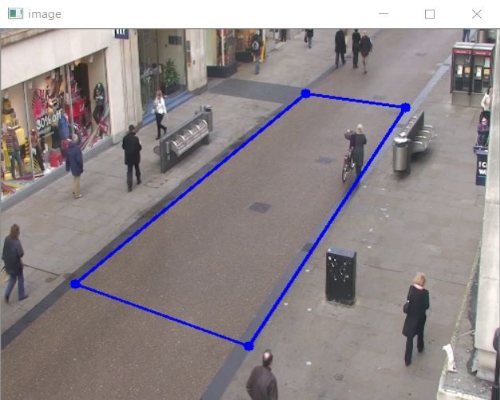

In [ ]:
quad=cv2.imread("mouse_click.JPG")
quad=cv2.resize(quad,(500,400))
cv2_imshow(quad)

<h3>Transformation Matrix</h3>

In [ ]:
# Utility function
def order_points(points):
  rect=np.zeros((4,2),dtype="float32")
  x=points[np.argsort(points,0)[:,0]]
  x1=x[:2,:]
  x2=x[2:,:]
  rect[2]=x1[np.argsort(x1,0)[:,1]][1,:]
  rect[1]=x2[np.argsort(x2,0)[:,1]][1,:]
  rect[0]=x2[np.argsort(x2,0)[:,1]][0,:]
  rect[3]=x1[np.argsort(x1,0)[:,1]][0,:]
  return rect

In [ ]:
# Returns Perspective Transformaton matrix
def getmap(image):

  # image : first frame of the input video
  
  global grid_H, grid_W
  h,w=image.shape[:2]
  # 4 corner points of image are set by default
  #corners=[[int(w*0.4),int(w*0.4)],[int(w*0.6),int(w*0.4)],[int(w*0.6),int(w*0.6)],[int(w*0.4),int(w*0.6)]]
  # User needs to finalise the corner points of a road or floor by dragging and dropping the corners
  #corners=mouse_click_event.adjust_coor_quad(image,corners)
  corners=[(308, 67), (413, 91), (245, 351), (75, 270)]
  corners=np.array(corners,dtype="float32")
  src=order_points(corners)
  (tl,tr,br,bl)=src
  width1=np.sqrt(((br[0]-bl[0])**2)+((br[1]-bl[1])**2))
  width2=np.sqrt(((tr[0]-tl[0])**2)+((tr[1]-tl[1])**2))
  width=max(int(width1),int(width2))
  height1=np.sqrt(((tr[0]-br[0])**2)+((tr[1]-br[1])**2))
  height2=np.sqrt(((tl[0]-bl[0])**2)+((tl[1]-bl[1])**2))
  height=max(int(height1),int(height2))
  width=int(width)
  height=int(height)
  dest=np.array([[0,0],[width-1,0],[width-1,height-1],[0,height-1]],dtype="float32")
  M=cv2.getPerspectiveTransform(src,dest)
  corners=np.array([[0,h-1,1],[w-1,h-1,1],[w-1,0,1],[0,0,1]],dtype="int")
  warped_corners=np.dot(corners,M.T)
  warped_corners=warped_corners/warped_corners[:,2].reshape((len(corners),1))
  warped_corners=np.int64(warped_corners)
  warped_corners=warped_corners[:,:2]
  min_coor=np.min(warped_corners,axis=0)
  max_coor=np.max(warped_corners,axis=0)
  grid_W,grid_H=max_coor-min_coor
  dest=np.array([[abs(min_coor[0]),abs(min_coor[1])],[abs(min_coor[0])+width-1,abs(min_coor[1])],[abs(min_coor[0])+width-1,abs(min_coor[1])+height-1],[abs(min_coor[0]),abs(min_coor[1])+height-1]],dtype="float32")
  M=cv2.getPerspectiveTransform(src,dest)
  return M

<h3> Calibrate image points</h3>

Using the transformation matrix, we need to:

1. calibrate the positions of detected people to their corresponding positions in the warped image or "bird's eye view grid".
2. calculate the minimum social distance to be maintained.

An average person height is 5-6 feets. And we need to maintain social distance of 6 feets. Thus, from the results of pedestrian detector, the median height of people is determined, and we set this height as MIN_DISTANCE. But, this height needs to be calibrated in order to use it for Distance-Violation Determination (which is completely based on top-down view).

In [ ]:
# Returns calibrated positions of detected people
def calibration(M,results):
  # calculate minimum distance for social distancing
  global MIN_DISTANCE
  rect=np.array([r[1] for r in results])
  h=np.median(rect[:,2]-rect[:,0])
  coor=np.array([[50,100,1],[50,100+h,1]],dtype="int")
  coor=np.dot(coor,M.T)
  coor=coor/coor[:,2].reshape((2,1))
  coor=np.int64(coor[:,:2])
  MIN_DISTANCE=int(round(dist.pdist(coor)[0]))

  #calculate centroid points of detected people location corresponding to bird's eye view black grid
  centroids=np.array([r[2] for r in results])
  centroids=np.c_[centroids,np.ones((centroids.shape[0],1),dtype="int")]
  warped_centroids=np.dot(centroids,M.T)
  warped_centroids=warped_centroids/warped_centroids[:,2].reshape((len(centroids),1))
  warped_centroids=np.int64(warped_centroids)
  return warped_centroids[:,:2]

### Distance-Violation Determination

Now that we have positions of people in the top-down view, the final step of pipeline is to check if any person is in close proximity to one or more people.

The brute force method is to evaluate the euclidean distances between every possible pair and determine which pair(s) crosses the limit. This can be easily achieved by utilizing the fast and advanced python libraries - numpy and scipy.

In [ ]:
# Returns a 2D numpy matrix consisting of list of pairs of indices indicating the positions of violators
def calc_dist(centroids):

  # centroids : updated centroids in top-down view coordinates

  if len(centroids)<2:  # no pair of people, no violation
    return list()
  # evaluate the pairwise distances between people
  condensed_dist=dist.pdist(centroids)
  D=dist.squareform(condensed_dist)
  locations=np.where(D<MIN_DISTANCE)
  violate=list(zip(locations[0],locations[1]))
  violate=np.sort(violate,axis=1)
  violate=np.unique(violate,axis=0)
  violate=np.asarray(list(filter(lambda x:x[0]!=x[1],violate)))
  return violate

### Visualisation

Everything is useless without visualising what's happening!

In our project, colour "green" symbolizes people following social distancing and colour "red" remarks people violating the safety norm.

Basically, the following frames are used for visualisation:

1. **Output** - shows the input video frames in addition to green and red bounding boxes around the people. It also shows red lines connecting the violators for better understanding.

2. **Bird's eye view grid** - shows a black frame locating all the people in top-down view with their colour codes (green/red) as points. One or more red lines are connected between the points when the points (or people) come in close proximity.

3. **Warped image** - (optional, for understanding operations) shows the top-down view of input video frames with the colour-coded points on people.

<h3>Visualise Output Frame</h3>

In [ ]:
def visualise_main(frame,results,violate):
  for (i,(prob,bbox,centroid)) in enumerate(results):
    (startX,startY,endX,endY)=bbox
    (cX,cY)=centroid
    colour=(0,255,0)
    if i in np.unique(violate):
      colour=(0,0,255)
    frame=cv2.rectangle(frame,(startX,startY),(endX,endY),colour,2)
    frame=cv2.circle(frame,(cX,cY),5,colour,1)
    # determining the probabilities of results of pedestrian detection
    # text = f"{prob:.2f}"
    # (text_width, text_height) = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, fontScale=1, thickness=2)[0]
    # text_offset_x = startX
    # text_offset_y = startY - 5
    # box_coords = ((text_offset_x, text_offset_y), (text_offset_x + text_width + 2, text_offset_y - text_height))
    # overlay = frame.copy()
    # overlay=cv2.rectangle(overlay, box_coords[0], box_coords[1], color=colour, thickness=2)
    # frame = cv2.addWeighted(overlay, 0.6, frame, 0.4, 0)
    # cv2.putText(frame, text, (startX, startY - 5), cv2.FONT_HERSHEY_SIMPLEX,fontScale=1, color=(0, 0, 0), thickness=2)

  #Drawing the connecting lines between violators
  for i,j in violate:
      frame=cv2.line(frame,results[i][2],results[j][2],(0,0,255),2)
  return frame

<h3>Visualise Bird's eye view grid and Warped Frames</h3>

In [ ]:
def visualise_grid(image,M,centroids,violate):
  warped=cv2.warpPerspective(image,M,(grid_W,grid_H),cv2.INTER_AREA, borderMode=cv2.BORDER_CONSTANT, borderValue=(0,0,0))
  grid=np.zeros(warped.shape,dtype=np.uint8)
  for i in range(len(centroids)):
    colour=(0,255,0)
    if i in np.unique(violate):
      colour=(0,0,255)
    grid=cv2.circle(grid,tuple(centroids[i,:]),5,colour,-1)
    warped=cv2.circle(warped,tuple(centroids[i,:]),5,colour,-1)
  for i,j in violate:
    grid=cv2.line(grid,tuple(centroids[i]),tuple(centroids[j]),(0,0,255),2)
  #cv2_imshow("Bird's eye view grid",cv2.resize(grid,image.shape[:2][::-1]))
  #cv2_imshow("warped",cv2.resize(warped,image.shape[:2][::-1]))
  grid=cv2.resize(grid,image.shape[:2][::-1])
  warped=cv2.resize(warped,image.shape[:2][::-1])
  return grid,warped

### Apply all the functions together

Implement the functions defined above step-by-step.

In [ ]:
def process(video):
  cap=cv2.VideoCapture(video)
  #Capture the first frame of video
  res,image=cap.read()
  if image is None:
    return
  image=cv2.resize(image,(320,320))
  mat=getmap(image)
  fourcc=cv2.VideoWriter_fourcc(*"XVID")
  out=cv2.VideoWriter("result.avi",fourcc,20.0,(320*3,320))
  fps = FPS().start()
  while True:
    res,image=cap.read()
    if image is None:
      break
    #pedestrian detection
    preprocessed_frame = preprocess_frame(image)
    results = pedestrian_detector(interpreter, preprocessed_frame, threshold=CONFIDENCE)
    preprocessed_frame = np.squeeze(preprocessed_frame) * 255.0
    preprocessed_frame = preprocessed_frame.clip(0, 255)
    preprocessed_frame = preprocessed_frame.squeeze()
    image = np.uint8(preprocessed_frame)
    #calibration
    warped_centroids=calibration(mat, results)
    #Distance-Violation Determination
    violate=calc_dist(warped_centroids)
    #Visualise grid
    grid,warped=visualise_grid(image,mat,warped_centroids,violate)
    #Visualise main frame
    image=visualise_main(image,results,violate)
    #Creating final output frame
    output=cv2.hconcat((image,warped))
    output=cv2.hconcat((output,grid))
    out.write(output)
    fps.update()
  fps.stop()
  print("[INFO] elasped time: {:.2f}".format(fps.elapsed()))
  print("[INFO] approx. FPS: {:.2f}".format(fps.fps()))
  cap.release()
  out.release()
  #cv2.destroyAllWindows()
  print("Done!")

## Implement the social distance detector

### Loading a TFLite model

In [ ]:
#@title Select the TFLite model
tflite_model = "ssd_mobiledet_cpu_coco_fp16.tflite" #@param ["ssd_mobiledet_cpu_coco_dr.tflite", "ssd_mobiledet_cpu_coco_fp16.tflite", "ssd_mobiledet_cpu_coco_int8.tflite"] 
interpreter = tf.lite.Interpreter(model_path=tflite_model)
interpreter.allocate_tensors()
_, HEIGHT, WIDTH, _ = interpreter.get_input_details()[0]['shape']
print(f"Height and width accepted by the model: {HEIGHT, WIDTH}")

Height and width accepted by the model: (320, 320)


### Download input video

In [ ]:
!wget -q https://github.com/piyush-cosmo/WoC_sdd_test/releases/download/v0.0.3/pedestrians.mp4

VIDEO_PATH = "/content/pedestrians.mp4"

### Show input video

In [ ]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open(VIDEO_PATH,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

### Generate Output Video

In [ ]:
process(VIDEO_PATH)

[INFO] elasped time: 59.08
[INFO] approx. FPS: 8.97
Done!


In [ ]:
# Convert the output to mp4 video
!ffmpeg -i "result.avi" output.mp4

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

### Show output video

In [ ]:
OUTPUT_VIDEO_PATH = "output.mp4"

from IPython.display import HTML
from base64 import b64encode
mp4 = open(OUTPUT_VIDEO_PATH,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

### Checking the implementation step-by-step

In [ ]:
image=cv2.imread("street.jpg")
image=cv2.resize(image,(500,400))

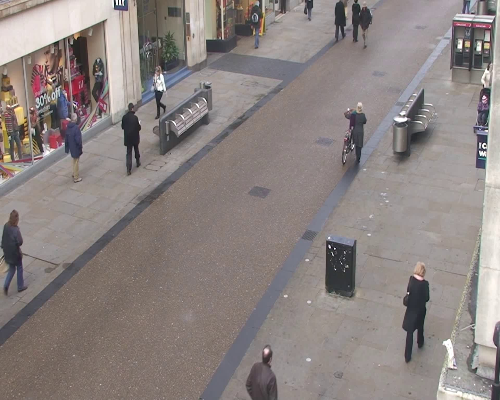

In [ ]:
cv2_imshow(image)

In [ ]:
preprocessed_frame = preprocess_frame(image)

In [ ]:
results = pedestrian_detector(interpreter, preprocessed_frame, threshold=CONFIDENCE)

In [ ]:
preprocessed_frame = np.squeeze(preprocessed_frame) * 255.0
preprocessed_frame = preprocessed_frame.clip(0, 255)
preprocessed_frame = preprocessed_frame.squeeze()
preprocessed_frame = np.uint8(preprocessed_frame)

In [ ]:
image=preprocessed_frame.copy()

In [ ]:
M=getmap(image)

In [ ]:
warped_centroids=calibration(M, results)

In [ ]:
violate=calc_dist(warped_centroids)

In [ ]:
grid,warped=visualise_grid(image,M,warped_centroids,violate)

In [ ]:
image=visualise_main(image,results,violate)

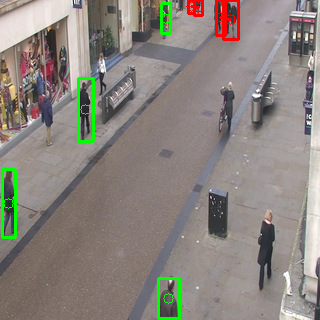

In [ ]:
cv2_imshow(image)

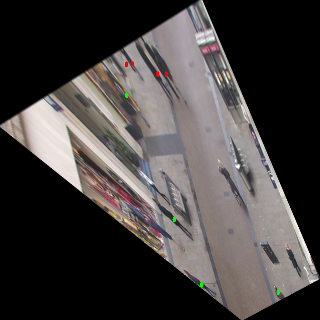

In [ ]:
cv2_imshow(warped)

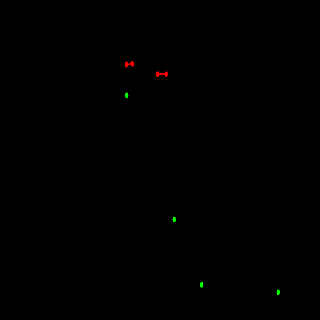

In [ ]:
cv2_imshow(grid)

## References

- [Sudarshana's colab](https://colab.research.google.com/drive/1xrApyONRVLU1jE-N_-t5wE1d3l4Sga4v?usp=sharing)
- [Piyush's colab](https://colab.research.google.com/drive/1HczCWXwnaqU1uZ9rGxnxL4JWVE7rmjCo?usp=sharing)
*   [Project idea](https://landing.ai/landing-ai-creates-an-ai-tool-to-help-customers-monitor-social-distancing-in-the-workplace/)
*   https://www.pyimagesearch.com/
*   http://stackoverflow.com/
*   [Distance calculation algorithm](https://github.com/aqeelanwar/SocialDistancingAI/blob/master/aux_functions.py)
*   [Object Detection with TensorFlow](https://colab.research.google.com/github/tensorflow/hub/blob/master/examples/colab/tf2_object_detection.ipynb)
*   [Image Processing in Google colab](https://colab.research.google.com/github/xn2333/OpenCV/blob/master/Image_Processing_in_Python_Final.ipynb#scrollTo=Tz7UAjxjfMuz)
*   [Visualisation function for main frame](https://github.com/tensorflow/models/blob/f6b4cbcdefb47d0d3c6126e60b6eeeafd5dfd28e/research/object_detection/utils/visualization_utils.py)
